In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/commonlit-evaluate-student-summaries/sample_submission.csv
/kaggle/input/commonlit-evaluate-student-summaries/prompts_train.csv
/kaggle/input/commonlit-evaluate-student-summaries/summaries_test.csv
/kaggle/input/commonlit-evaluate-student-summaries/summaries_train.csv
/kaggle/input/commonlit-evaluate-student-summaries/prompts_test.csv


## Importing neccessary libraries 

In [172]:
import matplotlib.pyplot as plt
import seaborn as sns

import gensim
from nltk.corpus import stopwords
from wordcloud import WordCloud

from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error

## Loading and understanding data

In [5]:
df_train_summaries = pd.read_csv('/kaggle/input/commonlit-evaluate-student-summaries/summaries_train.csv')
df_train_prompts = pd.read_csv('/kaggle/input/commonlit-evaluate-student-summaries/prompts_train.csv')

df_test_summaries = pd.read_csv('/kaggle/input/commonlit-evaluate-student-summaries/summaries_test.csv')
df_test_prompts = pd.read_csv('/kaggle/input/commonlit-evaluate-student-summaries/prompts_test.csv')

df_sample_submission = pd.read_csv('/kaggle/input/commonlit-evaluate-student-summaries/sample_submission.csv')

In [6]:
df_train_summaries

,student_id,prompt_id,text,content,wording
0,000e8c3c7ddb,814d6b,The third wave was an experimentto see how peo...,0.205683,0.380538
1,0020ae56ffbf,ebad26,They would rub it up with soda to make the sme...,-0.548304,0.506755
2,004e978e639e,3b9047,"In Egypt, there were many occupations and soci...",3.128928,4.231226
3,005ab0199905,3b9047,The highest class was Pharaohs these people we...,-0.210614,-0.471415
4,0070c9e7af47,814d6b,The Third Wave developed rapidly because the ...,3.272894,3.219757
...,...,...,...,...,...
7160,ff7c7e70df07,ebad26,They used all sorts of chemical concoctions to...,0.205683,0.380538
7161,ffc34d056498,3b9047,The lowest classes are slaves and farmers slav...,-0.308448,0.048171
7162,ffd1576d2e1b,3b9047,they sorta made people start workin...,-1.408180,-0.493603
7163,ffe4a98093b2,39c16e,An ideal tragety has three elements that make ...,-0.393310,0.627128


In [7]:
df_train_prompts

,prompt_id,prompt_question,prompt_title,prompt_text
0,39c16e,Summarize at least 3 elements of an ideal trag...,On Tragedy,Chapter 13 \r\nAs the sequel to what has alrea...
1,3b9047,"In complete sentences, summarize the structure...",Egyptian Social Structure,Egyptian society was structured like a pyramid...
2,814d6b,Summarize how the Third Wave developed over su...,The Third Wave,Background \r\nThe Third Wave experiment took ...
3,ebad26,Summarize the various ways the factory would u...,Excerpt from The Jungle,"With one member trimming beef in a cannery, an..."


In [8]:
df_test_summaries

,student_id,prompt_id,text
0,000000ffffff,abc123,Example text 1
1,111111eeeeee,def789,Example text 2
2,222222cccccc,abc123,Example text 3
3,333333dddddd,def789,Example text 4


In [9]:
df_test_prompts

,prompt_id,prompt_question,prompt_title,prompt_text
0,abc123,Summarize...,Example Title 1,Heading\nText...
1,def789,Summarize...,Example Title 2,Heading\nText...


In [10]:
df_sample_submission

,student_id,content,wording
0,000000ffffff,0.0,0.0
1,111111eeeeee,0.0,0.0
2,222222cccccc,0.0,0.0
3,333333dddddd,0.0,0.0


In [11]:
df_train_summaries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7165 entries, 0 to 7164
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   student_id  7165 non-null   object 
 1   prompt_id   7165 non-null   object 
 2   text        7165 non-null   object 
 3   content     7165 non-null   float64
 4   wording     7165 non-null   float64
dtypes: float64(2), object(3)
memory usage: 280.0+ KB


In [12]:
df_train_prompts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   prompt_id        4 non-null      object
 1   prompt_question  4 non-null      object
 2   prompt_title     4 non-null      object
 3   prompt_text      4 non-null      object
dtypes: object(4)
memory usage: 256.0+ bytes


## Evaluation Metrics

For this competition submissions are evaluated using MCRMSE or in other words mean columnwise root mean squared error:
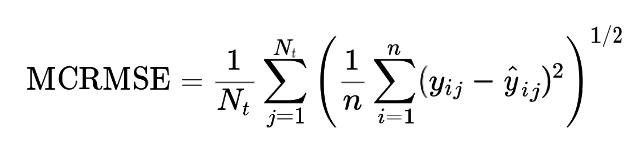

For more details: https://www.kaggle.com/competitions/commonlit-evaluate-student-summaries/overview

## Data Preparation 
This step involves two different parts, first of all i need to clean subsets of data (to remove stopwrods, clear punctuation and then to perform EDA on this dataset. Firstly, let's see what is going on in texts to understand what we need to remove, for this, I will take 5 random examples form dataset

In [13]:
for i in range(5):
    rand_number = np.random.randint(0, df_train_summaries.shape[0])
    print(df_train_summaries.loc[rand_number, 'text']+'\n')

In line 14 it says that the spoiled meat would be rubbed up with soda to take the smell away and sold to free-lunch counters.

The andent egyptian systam of government is a system that held everyone in place, the pharohs were at the top and the slaves were at the bottom. The way everyone was treated was different the pharohs were treated like royalty, while the slaves were treates like wild animals. 

They would use spoiled meat and mix it in with the meat that is not spoiled.  Also they will can it or chop it up into sausage.

  A perfect tragedy should, as we have seen, be arranged not on the simple but on the complex plan. It should, moreover, imitate actions that excite pity and fear, this being the distinctive mark of tragic imitation.

Ron developed an authoritative dictatorship in the classroom to teach students the "German mentality". He emphasized many simple rules and made sure they did it right. The students also had to salute each other in a specific way that the teacher ha

In [14]:
# Function for removing stopwords in the text
stop_words = stopwords.words('english')
def prerocess_stopwords(text):
    result = []
    for word in gensim.utils.simple_preprocess(text):
        if(
            word not in gensim.parsing.preprocessing.STOPWORDS and
            word not in stop_words
        ):
            result.append(word)
            
    result = " ".join(result)
    return result


In [15]:
#First of all let's merge two datasets for convenience
df_train = df_train_summaries.merge(df_train_prompts, on = 'prompt_id')


In [16]:
df_train['cleaned_text'] = df_train['text'].map(prerocess_stopwords)
df_train_cleaned_text  = df_train[['student_id', 'prompt_id', 'cleaned_text','prompt_question', 
                                       'prompt_title', 'prompt_text','content', 'wording']]
df_train_stained_text = df_train[['student_id', 'prompt_id', 'text','prompt_question', 
                                       'prompt_title', 'prompt_text','content', 'wording']]

In [17]:
class Preprocess_data:
    def __init__(self, df, text_column):
        self.df = df
        self.text_column = text_column
    
    def add_num_words(self):
        self.df['num_words'] = self.df[self.text_column].apply(lambda x: len(x.split()))
        
    def add_num_unique_columns(self):
        self.df['num_unqiue_words'] = self.df[self.text_column].apply(lambda x: len(set(x.split())))
        
    def add_num_symbols(self):
        self.df['num_symbols'] = self.df[self.text_column].apply(len)
    
    def add_num_sent(self):
        self.df['num_sent'] = self.df[self.text_column].apply(lambda x: len(x.split('.')))
    
    def add_columns(self):
        self.add_num_words()
        self.add_num_unique_columns()
        self.add_num_symbols()
        self.add_num_sent()
        return self.df

In [18]:
df_train_cleaned_text = Preprocess_data(df_train_cleaned_text, 'cleaned_text').add_columns()
df_train_stained_text = Preprocess_data(df_train_stained_text, 'text').add_columns()

## Exploratory Data Analysis

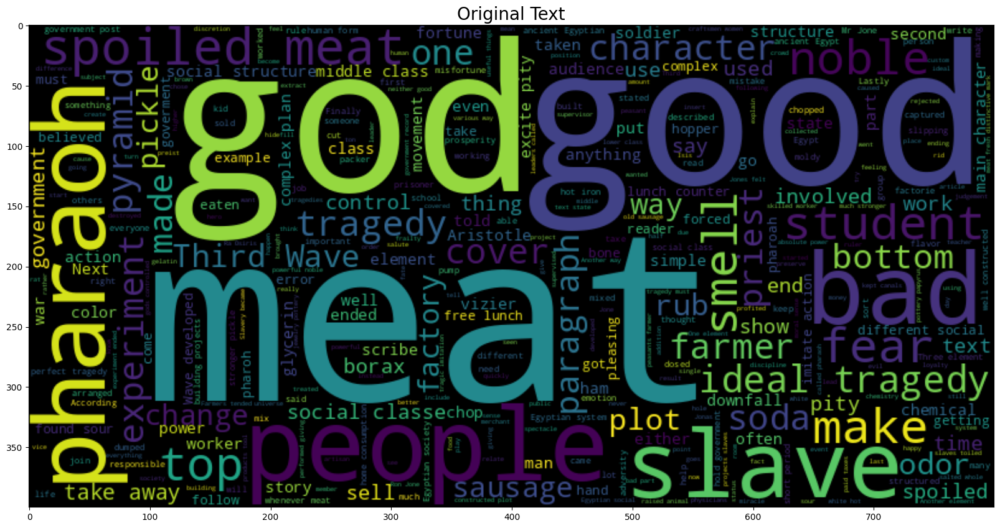

In [19]:
plt.figure(figsize = (20,20))
plt.title('Original Text', fontsize = 20)
wc = WordCloud(max_words = 600 , width = 800, height = 400).generate(" ".join(df_train['text']))
plt.imshow(wc, interpolation = 'bilinear')

Now we will see how this words have changed after removing stopwords

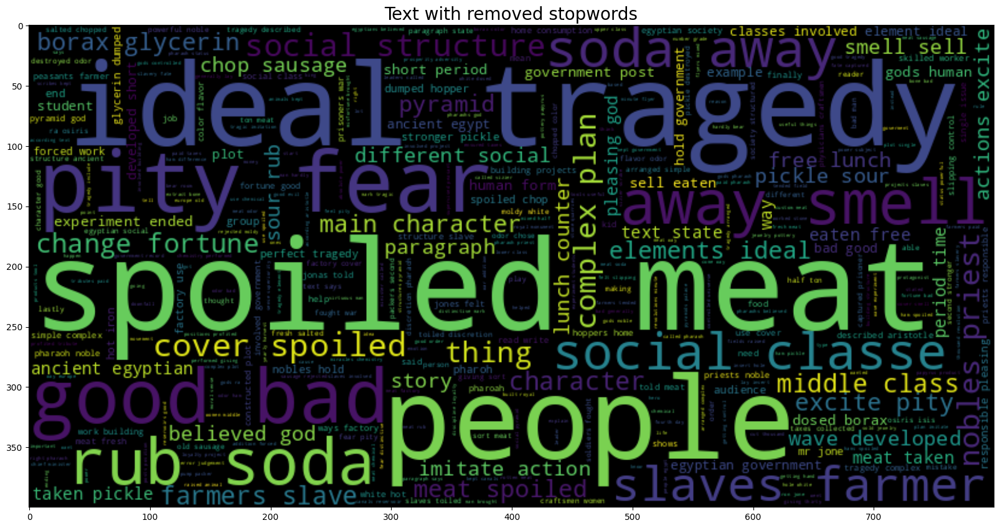

In [20]:
plt.figure(figsize = (20,20))
plt.title('Text with removed stopwords',fontsize=  20)
wc = WordCloud(max_words = 600 , width = 800, height = 400).generate(" ".join(df_train['cleaned_text']))
plt.imshow(wc, interpolation = 'bilinear')

So we can see that most used words among all texts has changed, or their influence become not so big as before.

In [21]:
def plot_words_for_text_group(text_group, title):
    df_for_comparing_texts = df_train[['prompt_title',text_group]].groupby('prompt_title').sum()
    df_for_comparing_texts.reset_index(inplace = True)

    fig,axes = plt.subplots(4, 1,figsize = (60,60))
    for ax in range(len(axes)):
        axes[ax].set_title(f'{title} with prompt_title: {df_for_comparing_texts.iloc[ax, 0]}', fontsize= 20)
        wc = WordCloud(max_words = 600 , width = 800, height = 400).generate(df_for_comparing_texts.loc[ax, text_group])
        axes[ax].imshow(wc, interpolation = 'bilinear')


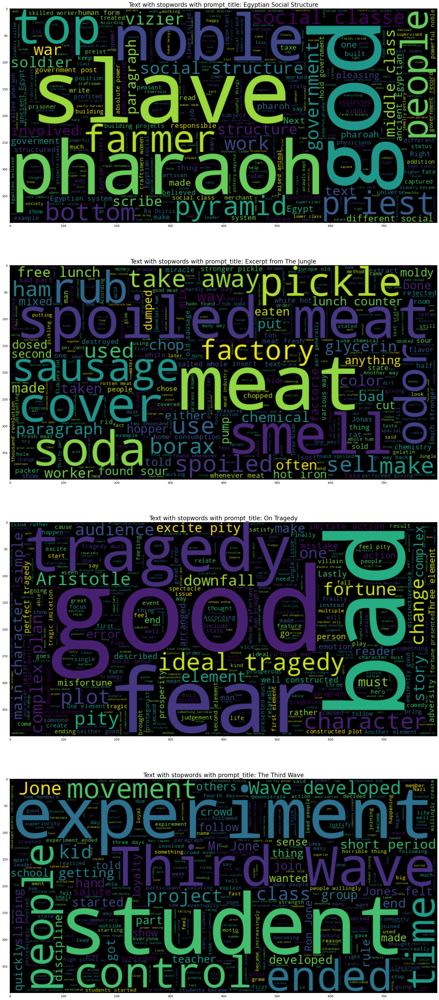

In [22]:
plot_words_for_text_group('text', 'Text with stopwords')

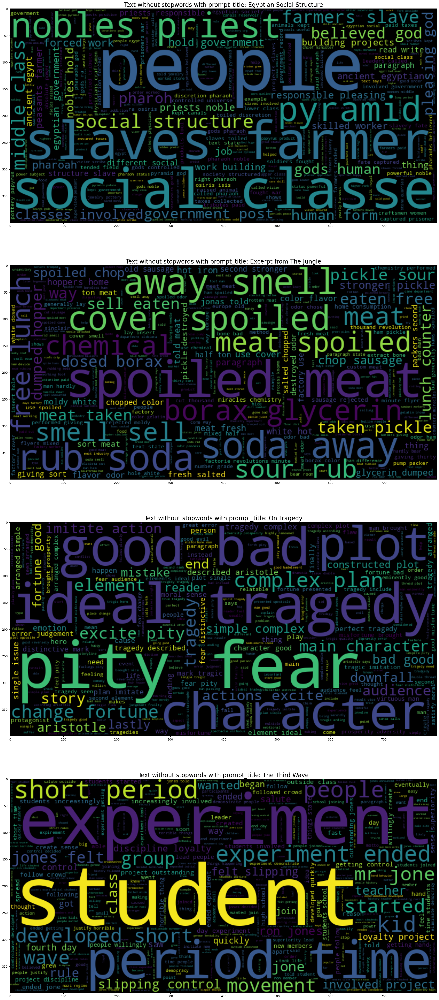

In [23]:
plot_words_for_text_group('cleaned_text', 'Text without stopwords')

As in the previous example, set of most used words have changed, so we will try to predict tagrget_columns on two datasets and then compare results. Next we will see how number of words and other new features influence target.

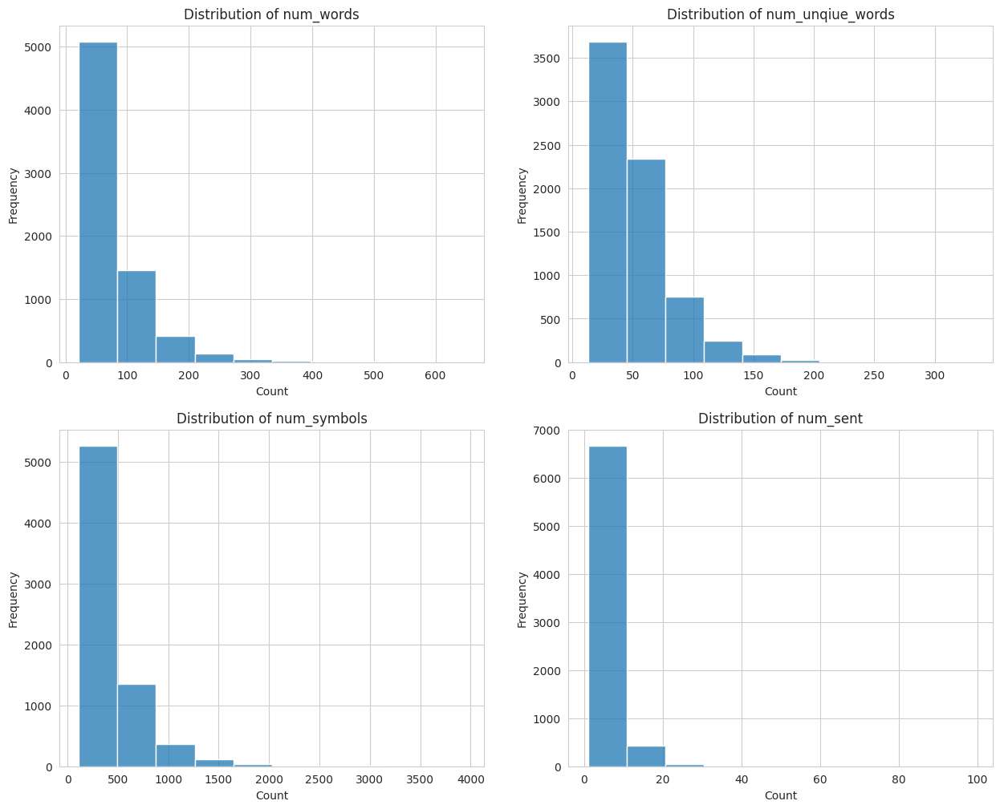

In [24]:
sns.set_style('whitegrid')
figure, axes = plt.subplots(2,2, figsize = (15,12))
columns_for_plot = ["num_words","num_unqiue_words","num_symbols","num_sent"]
col = 0
for ax1 in range(axes.shape[0]):
    for ax2 in range(axes.shape[1]):
        axes[ax1, ax2].set_title(f'Distribution of {columns_for_plot[col]}')
        sns.histplot(df_train_stained_text[columns_for_plot[col]], ax = axes[ax1, ax2], bins =10)
        axes[ax1, ax2].set_xlabel('Count')
        axes[ax1, ax2].set_ylabel('Frequency')
        col+=1
    

Now let's see the same distributions only for different prompts group

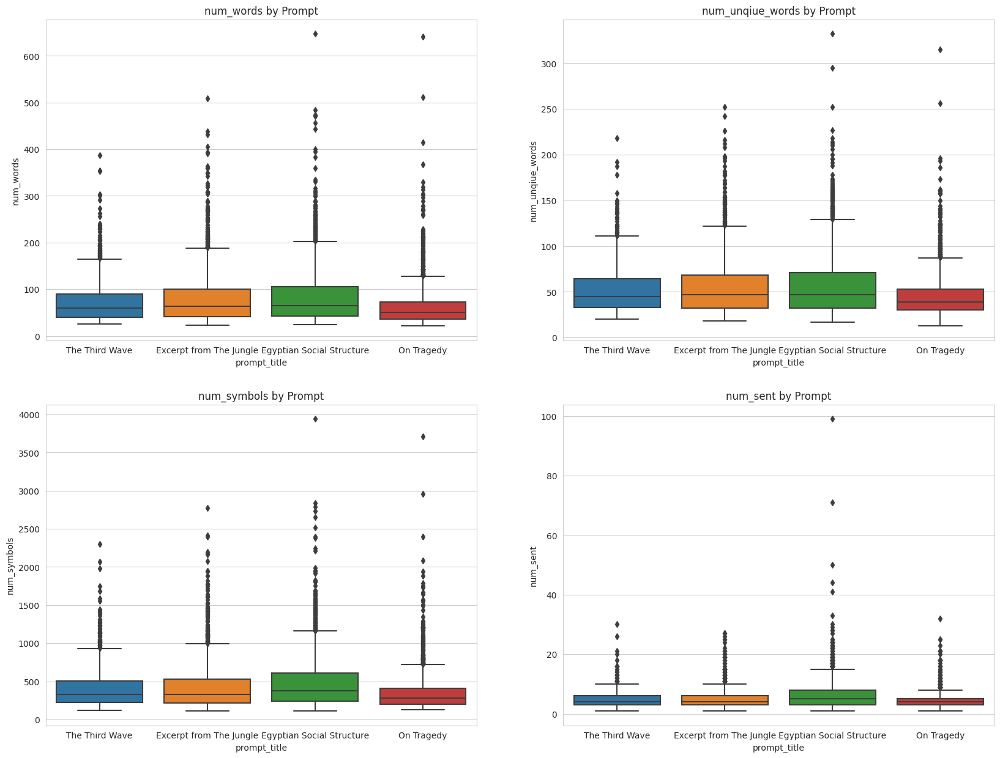

In [25]:
fig, axes = plt.subplots(2,2,figsize = (20,15))

columns_for_plot = ["num_words","num_unqiue_words","num_symbols","num_sent"]
col = 0
for ax1 in range(axes.shape[0]):
    for ax2 in range(axes.shape[1]):
        axes[ax1,ax2].set_title(f'{columns_for_plot[col]} by Prompt')
        data_for_plot = df_train_stained_text[[columns_for_plot[col],'prompt_title']]
        sns.boxplot(x = data_for_plot['prompt_title'], y =data_for_plot[columns_for_plot[col]], ax = axes[ax1, ax2])
        col+=1


So, we examined that all categories don't have big difference between their values. Now we will try to investigate link between these 4 columns and target columns

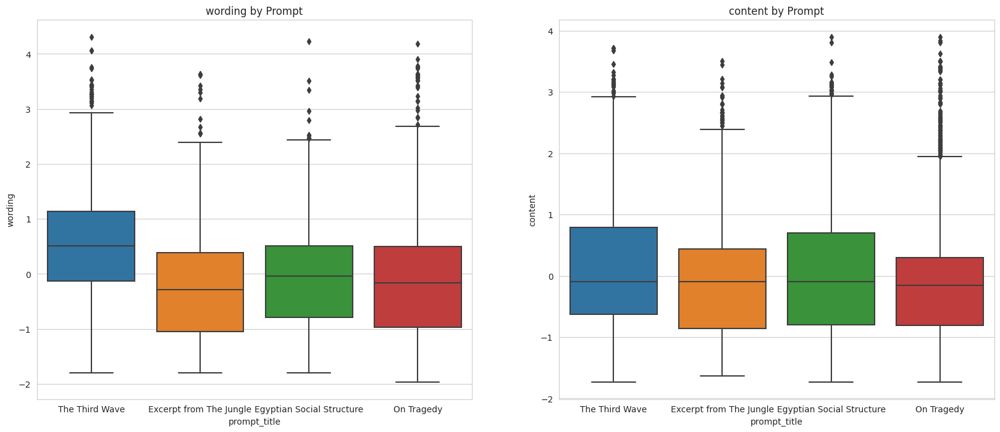

In [26]:
fig, axes = plt.subplots(1,2, figsize = (20,8))

columns_for_plot = ['wording', 'content']
for ax in range(axes.shape[0]):
        axes[ax].set_title(f'{columns_for_plot[ax]} by Prompt')
        data_for_plot = df_train_stained_text[[columns_for_plot[ax],'prompt_title']]
        sns.boxplot(x = data_for_plot['prompt_title'], y =data_for_plot[columns_for_plot[ax]], ax = axes[ax])

Here we can observe that median of wording score in category "The Third Wave" is bigger than in other categories, on other hand content score for this column has the same median as in other columns

Correlation between Content and number of words: 0.7926262521709251
Correlation between Wording and number of words: 0.5363430984854717


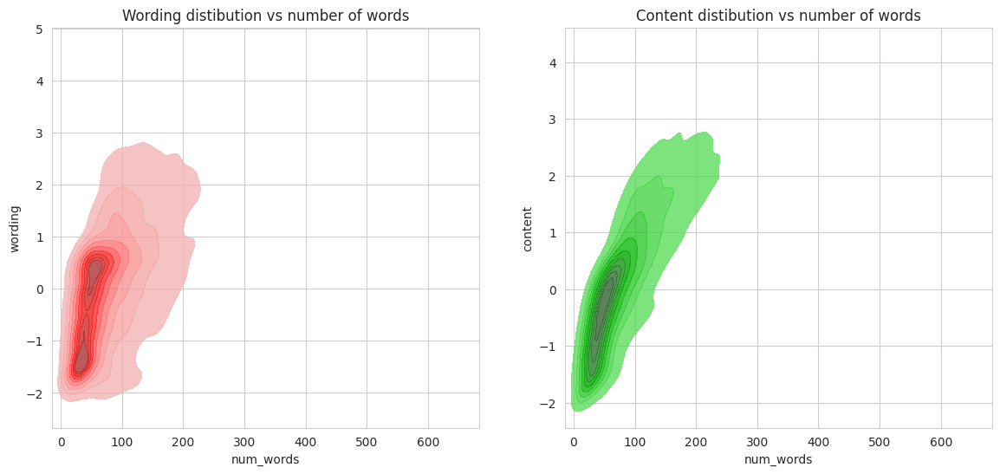

In [27]:
fig, axes = plt.subplots(1,2,figsize=(14,6)) 

axes[0].set_title('Wording distibution vs number of words')
sns.kdeplot(x = df_train_stained_text['num_words'], y =df_train_stained_text['wording'], ax = axes[0],fill = True, alpha=.8, color = 'r')

axes[1].set_title('Content distibution vs number of words')
sns.kdeplot(x = df_train_stained_text['num_words'], y = df_train_stained_text['content'], ax = axes[1], fill = True, alpha=.8, color = 'g')

corr_cont_num = df_train_stained_text['content'].corr(df_train_stained_text['num_words'])
corr_word_num = df_train_stained_text['wording'].corr(df_train_stained_text['num_words'])

print(f'Correlation between Content and number of words: {corr_cont_num }')
print(f'Correlation between Wording and number of words: {corr_word_num }')

So in both cases we get positive correlation with scores for wording and content. However in case of Content column it is more positive than in content column. Overall, texts with more words tends to have greater score for wording and content category

Correlation between Content and number of unique words: 0.806766673766287
Correlation between Wording and number of unique words: 0.5442711292966912


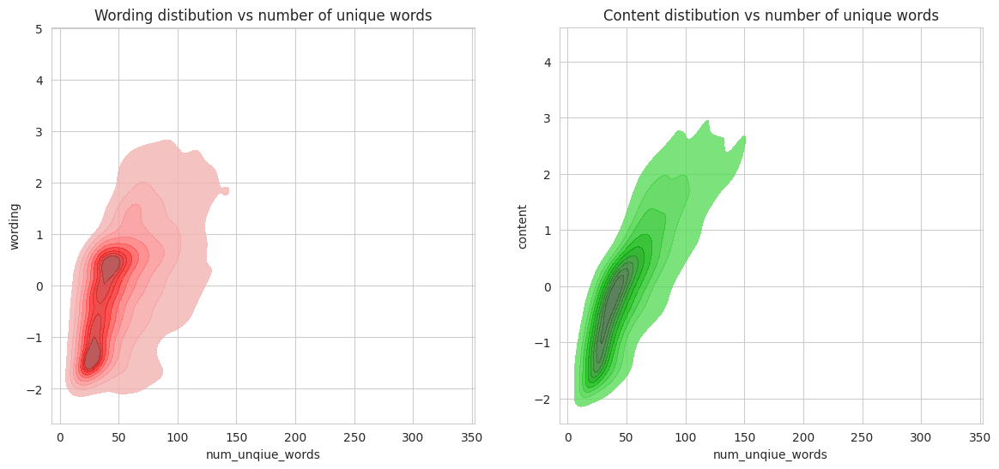

In [28]:
fig, axes = plt.subplots(1,2,figsize=(14,6)) 

axes[0].set_title('Wording distibution vs number of unique words')
sns.kdeplot(x = df_train_stained_text['num_unqiue_words'], y =df_train_stained_text['wording'], ax = axes[0],fill = True, alpha=.8, color = 'r')

axes[1].set_title('Content distibution vs number of unique words')
sns.kdeplot(x = df_train_stained_text['num_unqiue_words'], y = df_train_stained_text['content'], ax = axes[1], fill = True, alpha=.8, color = 'g')

corr_cont_num = df_train_stained_text['content'].corr(df_train_stained_text['num_unqiue_words'])
corr_word_num = df_train_stained_text['wording'].corr(df_train_stained_text['num_unqiue_words'])

print(f'Correlation between Content and number of unique words: {corr_cont_num }')
print(f'Correlation between Wording and number of unique words: {corr_word_num }')

Ther is a positive correlation between the number of unique words and content score, indicating that summaries with greater variety of words tend to have greater score for content part. Similar situation can be observed with wording score, however in this case correaltion not so strong as in situation with the content score.

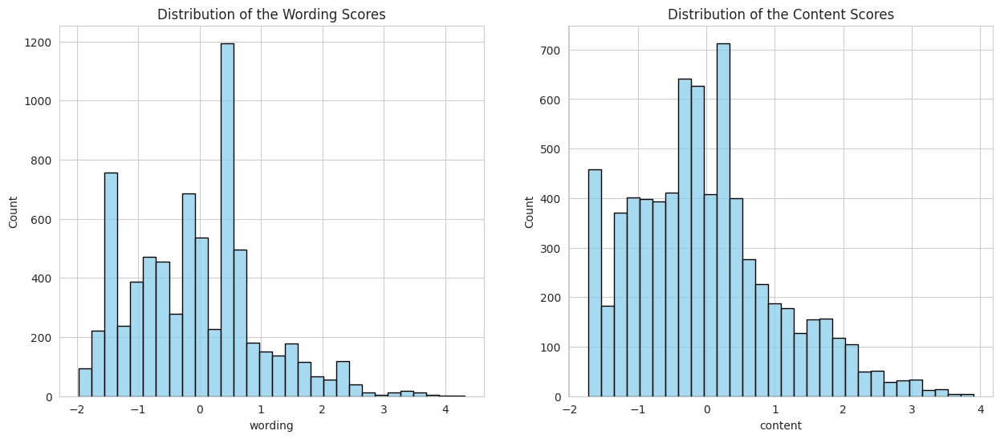

In [29]:
# And finnaly, I will comapre the distributons of wording and content scores
fig, axes = plt.subplots(1,2, figsize = (15,6))

axes[0].set_title('Distribution of the Wording Scores')
sns.histplot(df_train['wording'],color='skyblue', edgecolor='black', ax = axes[0], bins = 30)

axes[1].set_title('Distribution of the Content Scores')
sns.histplot(df_train['content'],color='skyblue', edgecolor='black', ax = axes[1], bins = 30);

Content Score Distribution is normal but slighylt left-skewed with a peak a bit below zero. This shows us that siginificant number of summaries have received negative score.

Wording distribution is also similar to normal, and left-skewed, with most of the scores below zero. 

Because all values in column "num_sent" in dataframe with cleaned text is 1, so we can drop it becaues it is useless.

In [30]:
df_train_cleaned_text.drop('num_sent', axis = 1, inplace = True)

## Modeling

In [31]:
# For identification category of prompt i will use only prompt_title,
#so another columns will be droped, also id columns will be dropped for right model traiing
columns_to_drop = ["student_id","prompt_id","prompt_question", "prompt_text"]
df_train_cleaned_text.drop(columns_to_drop, axis = 1, inplace = True)
df_train_stained_text.drop(columns_to_drop, axis = 1, inplace = True)

In [32]:
def set_dummy_variable(df, column):
    dummy_columns=pd.get_dummies(df[column], drop_first = True)
    new_df = pd.concat((df, dummy_columns), join = 'inner', axis = 1)
    new_df = new_df.drop(column, axis = 1)
    return new_df

df_train_cleaned_text = set_dummy_variable(df_train_cleaned_text, "prompt_title")
df_train_stained_text = set_dummy_variable(df_train_stained_text, "prompt_title")

In [186]:
df_train_cleaned_text.rename(columns={"cleaned_text": "text"}, inplace=True)
df_train_cleaned_text

,text,content,wording,num_words,num_unqiue_words,num_symbols,Excerpt from The Jungle,On Tragedy,The Third Wave
0,wave experimentto people reacted new leader go...,0.205683,0.380538,31,27,224,False,False,True
1,wave developed rapidly students genuinly belie...,3.272894,3.219757,88,70,677,False,False,True
2,wave started experiment class slowly spread ki...,0.205683,0.380538,27,21,194,False,False,True
3,experimen orginally terrible thngs happening f...,0.567975,0.969062,32,28,248,False,False,True
4,wave developed quickly students particip thos ...,-0.910596,-0.081769,13,12,90,False,False,True
...,...,...,...,...,...,...,...,...,...
7160,complex storyline plot makes audience feel pit...,-0.981265,-1.548900,15,15,109,False,True,False
7161,aristotle descirbes ideal tradgedy complex pla...,-0.511077,-1.589115,12,12,87,False,True,False
7162,tragedy complex plan simple good plot plot exc...,-0.834946,-0.593749,10,9,59,False,True,False
7163,aristotle believed ideal tradegy include purga...,-0.157460,-0.165811,27,23,201,False,True,False


Next our step will be constructing of the pipelines for the model and splitting dataset into validation and training

In [187]:
X_cleaned = df_train_cleaned_text.drop(["content","wording"], axis = 1)
X_stained = df_train_stained_text.drop(["content","wording"], axis = 1)

y_content = df_train["content"]
y_wording = df_train["wording"]

X_train_cleaned, X_val_clened, y_train_content, y_val_content = train_test_split(X_cleaned, y_content, test_size=0.2, random_state=42)
_, _, y_train_wording, y_val_wording = train_test_split(X_cleaned, y_wording, test_size=0.2, random_state=42)
X_train_stained, X_val_stained, _, _ = train_test_split(X_stained, y_wording, test_size=0.2, random_state=42)

In [194]:
def test_pipeline(pipeline):
    datasets = {'cleaned':{'train':X_train_cleaned, 
                           'validate':X_val_clened},
                
               'stained':{'train':X_train_stained,
                         'validate': X_val_stained},
                
               'target':{'train':[y_train_content,y_train_wording],
                        'validate':[y_val_content, y_val_wording]}
               }
                
    for data in list(datasets.keys())[0:2]:
        overall_rmse = 0
        for score in range(2):
            pipeline.fit(datasets[data]['train']['text'], datasets['target']['train'][score])
            prediction = pipeline.predict(datasets[data]['validate']['text'])  
            overall_rmse+= np.sqrt(mean_squared_error(prediction, datasets['target']['validate'][score]))
        mcrmse = overall_rmse/2
        print(f'MCRMSE for {data} dataset: {mcrmse}')

print('Linear Regression with l^2 reguralization: ')
ridge_pipleine = Pipeline([
    ('preprocessor', TfidfVectorizer()),
    ('ridge', Ridge())
])
test_pipeline(ridge_pipleine)

print('\nXGBRegressor: ')
xgbregressor_pipleine = Pipeline([
    ('preprocessor', TfidfVectorizer()),
    ('XGBRegressor', XGBRegressor())
])
test_pipeline(xgbregressor_pipleine)

print('\nRandomForestRegressor: ')
rfr_pipleine = Pipeline([
    ('preprocessor', TfidfVectorizer()),
    ('XGBRegressor', RandomForestRegressor(max_depth = 7))
])
test_pipeline(rfr_pipleine)

Linear Regression with l^2 reguralization: 
MCRMSE for cleaned dataset: 0.6846116974588801
MCRMSE for stained dataset: 0.6312885110009714

XGBRegressor: 
MCRMSE for cleaned dataset: 0.6638631081778938
MCRMSE for stained dataset: 0.6196178368126044

RandomForestRegressor: 
MCRMSE for cleaned dataset: 0.808013462523653
MCRMSE for stained dataset: 0.7202930759263043


So, for this task XGBRegressor has shown the best result approximately 0.62, but also we can try to add fetures that was used for EDA, to build new model with them,to use another Transformer for the text columns,to use different model,to tune parameteres of XGBRegressor, to try another data preprocessing proccess